# **Blood Cell Detection**

# **Installing the YOLOv5 Environment**
To start off with YOLOv5 we first clone the YOLOv5 repository and install dependencies.

In [1]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
#Install the required packages from your cloned repository root directory
!pip install -U -r yolov5/requirements.txt  # install dependencies
#Enter the repository root directory
%cd /content/yolov5

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5


In [2]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
#Torch is an open-source machine learning library
import torch

from IPython.display import Image, clear_output  # to display images

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.10.0+cu111 _CudaDeviceProperties(name='Tesla K80', major=3, minor=7, total_memory=11441MB, multi_processor_count=13)


# **Download Correctly Formatted Custom Dataset** 

The dataset is downloaded from Roboflow in the "**YOLOv5 PyTorch**" export format. In this notebook we will be using Roboflow an automated machine learning solution to annotate and transform datasets into a trained computer vision model, ready for deployment.

In [3]:
#install roboflow packages 
!pip install -q roboflow
#Everything in the package works through the Roboflow() object.
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="roboflow-yolov5")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=roboflow-yolov5


# **Blood Cell Dataset**

We will try to identify three types of cells:

*   **White Blood Cells**: WBCs protect your body against infection
*   **Red Blood Cells**: RBCs carry oxygen from our lungs to the rest of our bodies
*   **Platelets**: Platelets, or thrombocytes, are small, colorless cell fragments in our blood that form clots and stop or prevent bleeding.

<img src="https://v1.nitrocdn.com/bvIhcJyiWKFqlMsfAAXRLitDZjWdRlLX/assets/static/optimized/rev-5131b73/wp-content/uploads/2021/05/bloodcells.jpg"
     alt="Blood Cells">






In [4]:
#place all the dataset in one directory
%cd /content/

#download the blood cell dataset
!curl -L "https://public.roboflow.com/ds/0dFJwr7N4p?key=DLe5W4OfEo" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   2169      0 --:--:-- --:--:-- --:--:--  2169
100 12.7M  100 12.7M    0     0  20.6M      0 --:--:-- --:--:-- --:--:--  193M
Archive:  roboflow.zip
replace README.dataset.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


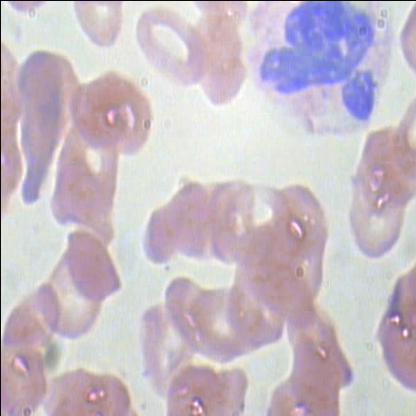

In [5]:
#Plotting images from our dataset
from PIL import Image
image = Image.open('/content/train/images/BloodImage_00001_jpg.rf.1a3206b15602db1d97193162a50bd001.jpg')
image.show()

# **Define YOLOv5 Model Configuration and Architecture**

In [7]:
# YOLOv5 model configuration file
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

# **Train Custom YOLOv5 Detector**
Next, we'll fire off training!
Here, we are able to pass a number of arguments:

1. **img**: define input image size
2. **batch**: determine batch size
3. **epochs**: define the number of training epochs. (Note: often, 3000+ are common here!)
4. **data**: set the path to our yaml file
5. **cfg**: specify our model configuration
6. **weights**: specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive folder)
7. **name**: result names
8. **nosave**: only save the final checkpoint
9. **cache**: cache images for faster training

In [8]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python /content/yolov5/train.py --img 416 --batch 16 --epochs 100 --data /content/data.yaml --cfg /content/yolov5/models/yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
train: weights=, cfg=/content/yolov5/models/yolov5s.yaml, data=/content/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-88-g80cfaf4 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=

In [9]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

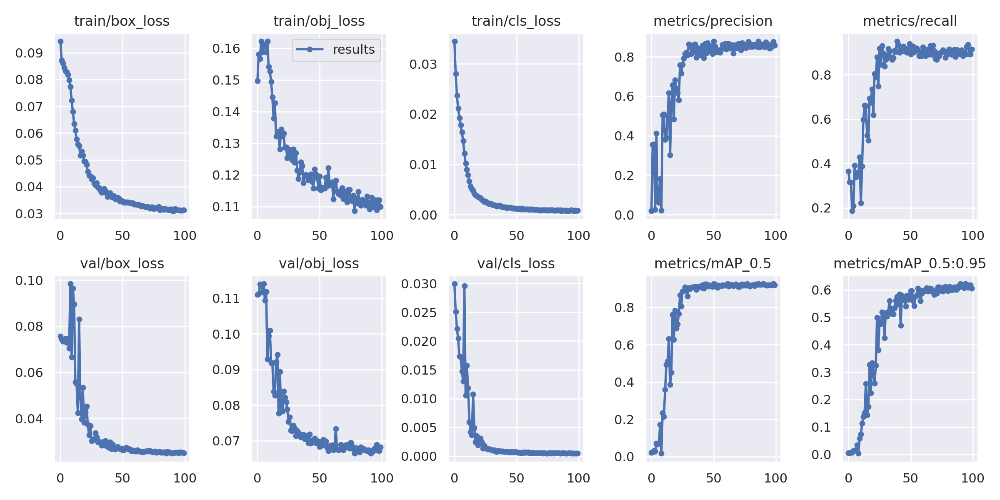

In [10]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

GROUND TRUTH TRAINING DATA:


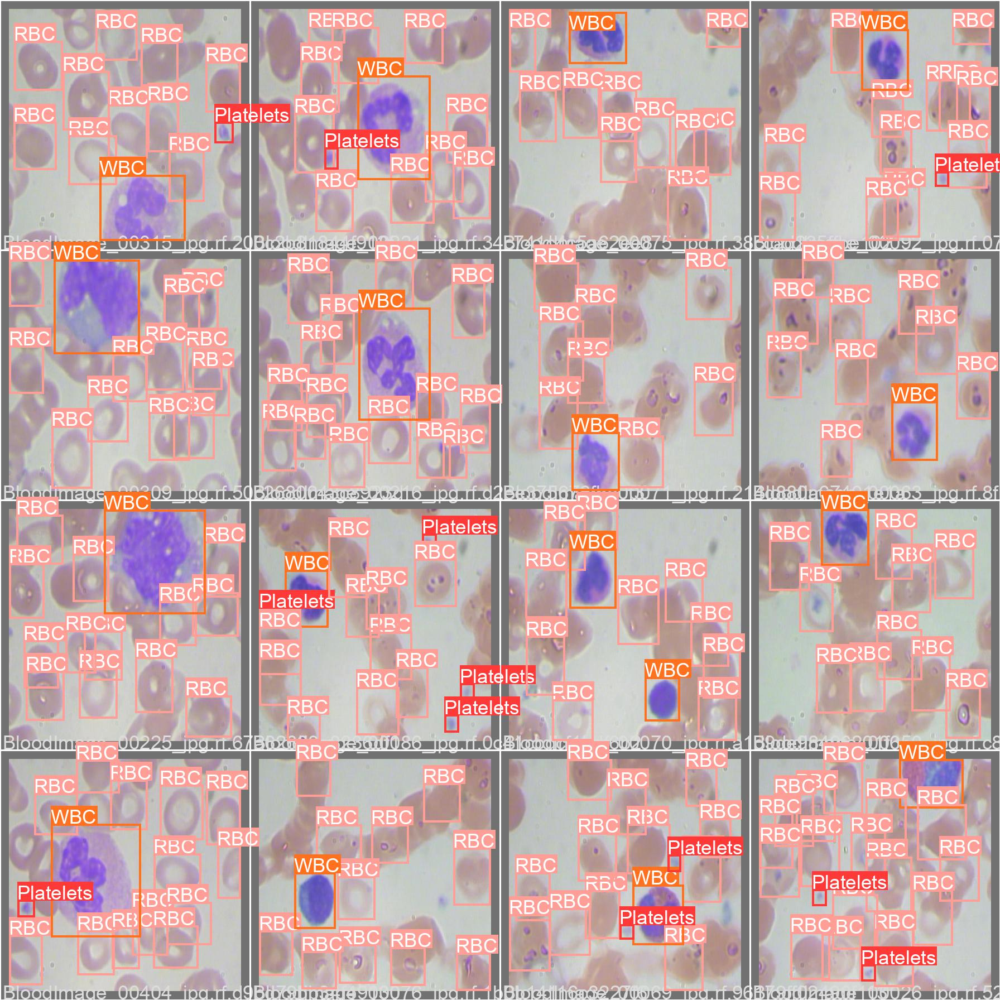

In [17]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch1_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


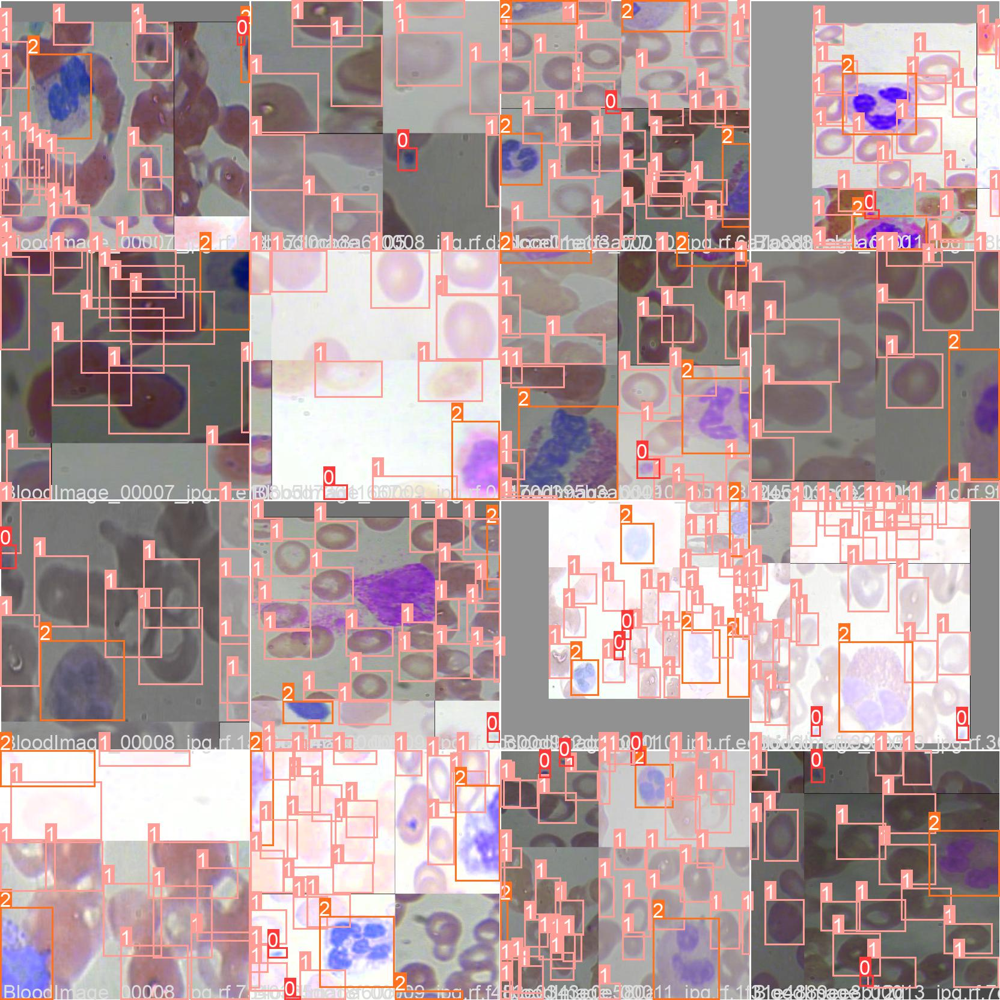

In [16]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch1.jpg', width=900)

In [12]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [13]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [14]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source ../test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=../test/images, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-86-g7473f0f torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/36 /content/test/images/BloodImage_00038_jpg.rf.ffa23e4b5b55b523367f332af726eae8.jpg: 416x416 2 Plateletss, 26 RBCs, 1 WBC, Done. (0.026s)
image 2/36 /content/test/images/BloodImage_00044_jpg.rf.e7760375eba4bc20c5746367e2311e18.jpg: 416x416 3 Plateletss, 18 RBCs, 2 WBCs, Done. (0.026s)
image 3/36 /content/test/images/BloodImage_00062_jpg.rf.1be1ca0ecdf783798fc10346b

In [11]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
%cp /content/yolov5/weights/last_yolov5s_custom.pt /content/gdrive/My\ Drive
